In [4]:
print('hello')

hello


In [35]:
%pip install pandas
%pip install matplotlib

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [6]:
import numpy as np
import pandas as pd
df= pd.read_csv("Data.csv")

In [7]:
print(df.to_string())

         BillNo                              Itemname  Quantity             Date      Price  CustomerID
0        558638           ZINC METAL HEART DECORATION        12    7/1/2011 8:16      1.250     16317.0
1        558638        HANGING JAM JAR T-LIGHT HOLDER        24    7/1/2011 8:16      0.850     16317.0
2        558638                  LANTERN CREAM GAZEBO         3    7/1/2011 8:16      4.950     16317.0
3        558638        ZINC T-LIGHT HOLDER STAR LARGE        12    7/1/2011 8:16      0.950     16317.0
4        558638         FRENCH TOILET SIGN BLUE METAL        12    7/1/2011 8:16      1.250     16317.0
5        558638      POTTERING IN THE SHED METAL SIGN        12    7/1/2011 8:16      2.080     16317.0
6        558638        METAL SIGN TAKE IT OR LEAVE IT         6    7/1/2011 8:16      2.950     16317.0
7        558638            ALARM CLOCK BAKELIKE GREEN         4    7/1/2011 8:16      3.750     16317.0
8        558638       DRAWER KNOB CRACKLE GLAZE IVORY        18 

In [8]:
df.describe

<bound method NDFrame.describe of         BillNo                            Itemname  Quantity             Date  \
0       558638         ZINC METAL HEART DECORATION        12    7/1/2011 8:16   
1       558638      HANGING JAM JAR T-LIGHT HOLDER        24    7/1/2011 8:16   
2       558638                LANTERN CREAM GAZEBO         3    7/1/2011 8:16   
3       558638      ZINC T-LIGHT HOLDER STAR LARGE        12    7/1/2011 8:16   
4       558638       FRENCH TOILET SIGN BLUE METAL        12    7/1/2011 8:16   
...        ...                                 ...       ...              ...   
110808  569202                   PLASMATRONIC LAMP         1  9/30/2011 17:22   
110809  569202       SET OF 2 ROUND TINS CAMEMBERT         1  9/30/2011 17:22   
110810  569202              MINI JIGSAW DOLLY GIRL         2  9/30/2011 17:22   
110811  569202           MINI JIGSAW CIRCUS PARADE         2  9/30/2011 17:22   
110812  569202  BLUE DRAWER KNOB ACRYLIC EDWARDIAN        10  9/30/2011 17:

In [9]:

df["Quantity"]= df["Quantity"].abs()
df["Quantity"].min()

1

In [10]:
df["Itemname"]=df["Itemname"].str.lower()
grouped_data = df.groupby('Itemname')['Quantity'].sum().reset_index()
grouped_data = grouped_data.sort_values(by='Quantity', ascending=False)

q1=grouped_data["Quantity"].quantile(.25)
q3=grouped_data["Quantity"].quantile(.75)

iqr= q3-q1
upper_bound = q3 + 1.5 * iqr
lower_bound = q1 


upper_outliers = grouped_data[grouped_data['Quantity'] > upper_bound]
below_outliers = grouped_data[grouped_data['Quantity'] < lower_bound]


print("Products which have the highest sales:")
print(upper_outliers)


print("\nProducts which have the lowest sales:")
print(below_outliers)


Products which have the highest sales:
                                Itemname  Quantity
1427             jumbo bag red retrospot     11857
187        assorted colour bird ornament     10942
2096                      popcorn holder     10604
3061   world war 2 gliders asstd designs      7714
2997  white hanging heart t-light holder      7304
...                                  ...       ...
956                 feather pen,hot pink       956
3072                wrap alphabet poster       955
2237               regency milk jug pink       953
2546  set/3 red gingham rose storage box       950
1304           heart ivory trellis small       950

[312 rows x 2 columns]

Products which have the lowest sales:
                                 Itemname  Quantity
252           beach hut shelf w 3 drawers        17
182         ass floral print spirit level        17
1395         ivory wire kitchen organiser        17
1612  marie antoinette trinket box silver        17
2491         set of 4 napk

In [11]:

# Load your data into a Pandas DataFrame
data = pd.read_csv('Data.csv')  

data['Date'] = pd.to_datetime(data['Date'])


data['Year'] = data['Date'].dt.year
data['Month'] = data['Date'].dt.month
data['DayOfWeek'] = data['Date'].dt.dayofweek  


monthly_avg_sales = data.groupby('Month')['Quantity'].sum()
print(monthly_avg_sales)

# To calculate the total sales for each day of the week
weekly_total_sales = data.groupby('DayOfWeek')['Quantity'].sum()
print(weekly_total_sales)



# Monthly sales were highest for the month 9 i.e September 
# Weekly sales were highest on 3rd weekday  i.e Wednesday 

Month
7    329760
8    328717
9    465466
Name: Quantity, dtype: int64
DayOfWeek
0    153119
1    220637
2    199856
3    279021
4    149970
6    121340
Name: Quantity, dtype: int64


In [12]:
df['Date']= pd.to_datetime(df['Date'])
df['Month']= df['Date'].dt.month
grouped_data = df.groupby(['Itemname', 'Month'])['Quantity'].sum().reset_index(name='Quantity')
mean = df['Quantity'].mean()
print(  mean)

print(grouped_data)
grouped_data['Z-Score'] = grouped_data.groupby('Itemname')['Quantity'].transform(
    lambda x: (x - x.mean()) / x.std())
print(grouped_data.to_string())

threshold = -1.15

# Find items where there is at least one negative outlier
items_with_negative_outliers = grouped_data[grouped_data['Z-Score'] < threshold]['Itemname'].unique()

# Display the items with negative outliers
print("Items with Negative Outliers:")
print(items_with_negative_outliers)
print("No of items that have l")
print(len(items_with_negative_outliers))

10.775044444243907
                              Itemname  Month  Quantity
0               10 colour spaceboy pen      7       351
1               10 colour spaceboy pen      8       206
2               10 colour spaceboy pen      9       362
3           12 coloured party balloons      7       147
4           12 coloured party balloons      8       135
...                                ...    ...       ...
7880       zinc wire kitchen organiser      7         3
7881       zinc wire kitchen organiser      8         2
7882  zinc wire sweetheart letter tray      7         4
7883  zinc wire sweetheart letter tray      8         1
7884  zinc wire sweetheart letter tray      9         2

[7885 rows x 3 columns]
                                  Itemname  Month  Quantity   Z-Score
0                   10 colour spaceboy pen      7       351  0.513026
1                   10 colour spaceboy pen      8       206 -1.152394
2                   10 colour spaceboy pen      9       362  0.639368
3   

In [13]:
q1=grouped_data["Quantity"].quantile(.25)
q3=grouped_data["Quantity"].quantile(.75)

iqr= q3-q1
upper_bound = q3 + 1.5 * iqr
lower_bound = q1 


upper_outliers = grouped_data[grouped_data['Quantity'] > upper_bound]
unique_item_names = upper_outliers['Itemname'].unique()

# Convert the unique item names to a list
item_names_list = unique_item_names.tolist()

# Print the list of unique item names


set1 = set(item_names_list)
set2 = set(items_with_negative_outliers)

# Find common items using the intersection operation
common_items = set1.intersection(set2)

# Convert the result back to a list
common_items_list = list(common_items)

# Print the items that are common to both lists
print("List of all the Items which Were Once BestSellers but their sales decresed recenetly:", common_items_list)
print("Number Of Items in this List:",len(common_items))

List of all the Items which Were Once BestSellers but their sales decresed recenetly: ['english rose garden secateurs', 'jumbo bag pink vintage paisley', 'jumbo bag owls', 'jazz hearts address book', 'funky diva pen', 'pack of 60 spaceboy cake cases', 'red  harmonica in box', '10 colour spaceboy pen', 'small zinc heart wall organiser', 'wood black board ant white finish', 'set/6 red spotty paper plates', 'hot water bottle i am so poorly', 'doormat hearts']
Number Of Items in this List: 13


In [14]:
%pip install mlxtend

Note: you may need to restart the kernel to use updated packages.


In [30]:


from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules

# Sample a portion of the data
  # You can adjust the sampling fraction


basket = data.groupby(['BillNo', 'Itemname'])['Quantity'].count().unstack().fillna(0)
basket = (basket > 0).astype(int)

frequent_itemsets = apriori(basket, min_support=0.05, use_colnames=True)  # Increase the min_support threshold to 5%

rules = association_rules(frequent_itemsets, metric="lift", min_threshold=9.0)

print (frequent_itemsets)
print(rules)





c:\Users\asus\Desktop\Emplay\Week2\Retail-Insights-Engine\Lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


     support                                           itemsets
0   0.052656                           (6 RIBBONS RUSTIC CHARM)
1   0.055452                       (ALARM CLOCK BAKELIKE GREEN)
2   0.076421                    (ASSORTED COLOUR BIRD ORNAMENT)
3   0.052889                (GARDENERS KNEELING PAD CUP OF TEA)
4   0.064772                 (GARDENERS KNEELING PAD KEEP CALM)
5   0.057549                            (HEART OF WICKER SMALL)
6   0.061976                           (JAM MAKING SET PRINTED)
7   0.051491                   (JUMBO  BAG BAROQUE BLACK WHITE)
8   0.073858                               (JUMBO BAG ALPHABET)
9   0.084576                                 (JUMBO BAG APPLES)
10  0.054287                                   (JUMBO BAG OWLS)
11  0.054287                                  (JUMBO BAG PEARS)
12  0.076421                          (JUMBO BAG PINK POLKADOT)
13  0.054520                   (JUMBO BAG PINK VINTAGE PAISLEY)
14  0.125349                          (J

In [31]:
common_product_pairs = rules.sort_values(by='confidence', ascending=False)

# Display the most common product pairs
print(common_product_pairs[['antecedents', 'consequents', 'support', 'confidence']])

Empty DataFrame
Columns: [antecedents, consequents, support, confidence]
Index: []


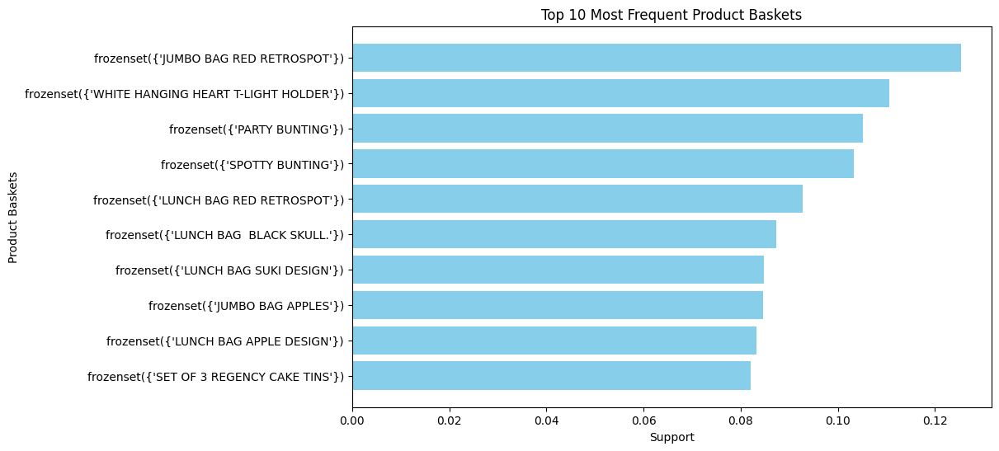

In [41]:
top_10_frequent_baskets = frequent_itemsets.sort_values(by='support', ascending=False).head(10)


plt.figure(figsize=(10, 6))
plt.barh(top_10_frequent_baskets['itemsets'].astype(str), top_10_frequent_baskets['support'], color='skyblue')
plt.xlabel('Support')
plt.ylabel('Product Baskets')
plt.title('Top 10 Most Frequent Product Baskets')
plt.gca().invert_yaxis()  
plt.show()

In [19]:
data = pd.read_csv('Data.csv')

# Calculate total sales for each customer
data['TotalSales'] = data['Quantity'] * data['Price']
customer_total_sales = data.groupby('CustomerID')['TotalSales'].sum()

# Define segmentation criteria (you can adjust these thresholds)
high_spend_threshold = 1000  # Example threshold for high-spending customers
medium_spend_threshold = 500  # Example threshold for medium-spending customers

# Create a new column 'CustomerSegment' with default value 'Low-Spending'
data['CustomerSegment'] = 'Low-Spending'

# Update the segment for high-spending and medium-spending customers
data.loc[data['CustomerID'].isin(customer_total_sales[customer_total_sales >= high_spend_threshold].index), 'CustomerSegment'] = 'High-Spending'
data.loc[data['CustomerID'].isin(customer_total_sales[(customer_total_sales >= medium_spend_threshold) & (customer_total_sales < high_spend_threshold)].index), 'CustomerSegment'] = 'Medium-Spending'

# Now, your data contains a 'CustomerSegment' column with customer segmentation information
print(data[['CustomerID', 'CustomerSegment']].drop_duplicates())

        CustomerID  CustomerSegment
0          16317.0  Medium-Spending
24         17865.0    High-Spending
53         17667.0     Low-Spending
74         13534.0    High-Spending
89         14868.0    High-Spending
...            ...              ...
110412     14503.0  Medium-Spending
110457     13021.0     Low-Spending
110500     17227.0     Low-Spending
110512     12842.0  Medium-Spending
110532     16613.0  Medium-Spending

[1940 rows x 2 columns]


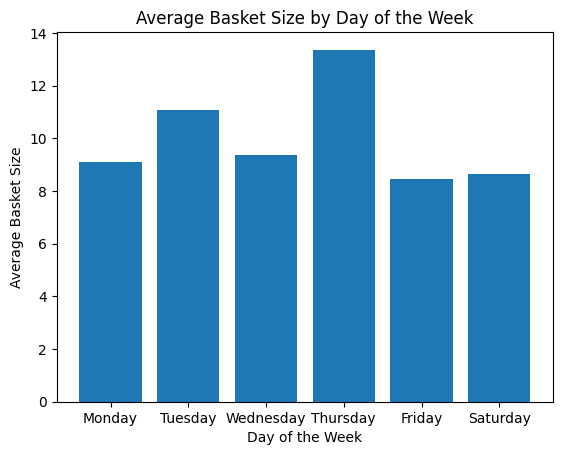

In [38]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'Date' column is in datetime format
data['Date'] = pd.to_datetime(data['Date'])

# Extract the day of the week (0=Monday, 6=Sunday)
data['Day_of_Week'] = data['Date'].dt.dayofweek

# Group data by day of the week and calculate the average basket size
basket_size_by_day = data.groupby('Day_of_Week')['Quantity'].mean()

# Create a bar chart to visualize the results
days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']  # Exclude Sunday
plt.bar(days, basket_size_by_day)
plt.xlabel('Day of the Week')
plt.ylabel('Average Basket Size')
plt.title('Average Basket Size by Day of the Week')
plt.show()


In [20]:
data = pd.read_csv('Data.csv')

# Calculate the total number of unique customers
total_unique_customers = data['CustomerID'].nunique()

# Calculate the number of repeat-purchasing customers
repeat_purchasing_customers = data['CustomerID'].value_counts()[data['CustomerID'].value_counts() > 1].count()

# Calculate the repeat purchase rate
repeat_purchase_rate = repeat_purchasing_customers / total_unique_customers

# Create a frequency distribution of repeat purchases
customer_purchase_frequency = data['CustomerID'].value_counts().value_counts().sort_index()

# Display the repeat purchase rate and frequency distribution
print(f"Repeat Purchase Rate: {repeat_purchase_rate:.2%}")
print("Frequency Distribution of Repeat Purchases:")
print(customer_purchase_frequency)

Repeat Purchase Rate: 97.83%
Frequency Distribution of Repeat Purchases:
count
1       42
2       47
3       25
4       42
5       36
        ..
568      1
582      1
773      1
885      1
2290     1
Name: count, Length: 194, dtype: int64


In [40]:
data = pd.read_csv('Data.csv')

# Define a time period (e.g., last 12 months)
customer_purchase_frequency = data.groupby('CustomerID')['BillNo'].nunique()
threshold = 10  # Adjust as needed
frequent_customers = customer_purchase_frequency[customer_purchase_frequency > threshold]
loyal_customer_data = data[data['CustomerID'].isin(frequent_customers.index)]


print(loyal_customer_data)





        BillNo                            Itemname  Quantity             Date  \
452     558702      MAGIC DRAWING SLATE DOLLY GIRL         1   7/1/2011 12:45   
453     558702     MAGIC DRAWING SLATE BAKE A CAKE         1   7/1/2011 12:45   
454     558702       MAGIC DRAWING SLATE LEAP FROG         1   7/1/2011 12:45   
455     558702  MINI WOODEN HAPPY BIRTHDAY GARLAND         3   7/1/2011 12:45   
456     558702      SINGLE ANTIQUE ROSE HOOK IVORY         2   7/1/2011 12:45   
...        ...                                 ...       ...              ...   
109920  569123  CHILDS BREAKFAST SET CIRCUS PARADE         1  9/30/2011 13:09   
109921  569123                   DELUXE SEWING KIT         6  9/30/2011 13:09   
109922  569123    SILVER FLOWR PINK SHELL NECKLACE        48  9/30/2011 13:09   
109923  569123   LAZER CUT NECKLACE W PASTEL BEADS        52  9/30/2011 13:09   
109924  569123            JUMBO BAG 50'S CHRISTMAS         5  9/30/2011 13:09   

        Price  CustomerID  